# XGBOOST로 전력소비량 예측
- building 사용 안 하고 해보기 -> smape 약 6.06
- tuning해서 최대한 낮춰보기

## Load Library

In [302]:
# Import Module
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import datetime
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
import seaborn as sns
import xgboost
from sklearn.svm import SVR
from sklearn.cluster import KMeans
from sklearn.model_selection import KFold
from tslearn.clustering import TimeSeriesKMeans, silhouette_score
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
from xgboost import XGBRegressor
import joblib
import inspect

import warnings
warnings.filterwarnings('ignore')

In [232]:
# Fixed random seed
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(42)

## Load Data

In [233]:
# Load Data
train = pd.read_csv('../data/train.csv')
test = pd.read_csv('../data/test.csv')
building = pd.read_csv('../data/building_info.csv')
sample_submission = pd.read_csv('../data/sample_submission.csv')

In [234]:
# train
display(train.head())
train.info()
train.shape

,num_date_time,건물번호,일시,기온(C),강수량(mm),풍속(m/s),습도(%),일조(hr),일사(MJ/m2),전력소비량(kWh)
0,1_20220601 00,1,20220601 00,18.6,NaN,0.9,42.0,NaN,NaN,1085.28
1,1_20220601 01,1,20220601 01,18.0,NaN,1.1,45.0,NaN,NaN,1047.36
2,1_20220601 02,1,20220601 02,17.7,NaN,1.5,45.0,NaN,NaN,974.88
3,1_20220601 03,1,20220601 03,16.7,NaN,1.4,48.0,NaN,NaN,953.76
4,1_20220601 04,1,20220601 04,18.4,NaN,2.8,43.0,NaN,NaN,986.40


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 204000 entries, 0 to 203999
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   num_date_time  204000 non-null  object 
 1   건물번호           204000 non-null  int64  
 2   일시             204000 non-null  object 
 3   기온(C)          204000 non-null  float64
 4   강수량(mm)        43931 non-null   float64
 5   풍속(m/s)        203981 non-null  float64
 6   습도(%)          203991 non-null  float64
 7   일조(hr)         128818 non-null  float64
 8   일사(MJ/m2)      116087 non-null  float64
 9   전력소비량(kWh)     204000 non-null  float64
dtypes: float64(7), int64(1), object(2)
memory usage: 15.6+ MB


(204000, 10)

In [235]:
# test
display(test.head())
test.info()
test.shape

,num_date_time,건물번호,일시,기온(C),강수량(mm),풍속(m/s),습도(%)
0,1_20220825 00,1,20220825 00,23.5,0.0,2.2,72
1,1_20220825 01,1,20220825 01,23.0,0.0,0.9,72
2,1_20220825 02,1,20220825 02,22.7,0.0,1.5,75
3,1_20220825 03,1,20220825 03,22.1,0.0,1.3,78
4,1_20220825 04,1,20220825 04,21.8,0.0,1.0,77


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16800 entries, 0 to 16799
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   num_date_time  16800 non-null  object 
 1   건물번호           16800 non-null  int64  
 2   일시             16800 non-null  object 
 3   기온(C)          16800 non-null  float64
 4   강수량(mm)        16800 non-null  float64
 5   풍속(m/s)        16800 non-null  float64
 6   습도(%)          16800 non-null  int64  
dtypes: float64(3), int64(2), object(2)
memory usage: 918.9+ KB


(16800, 7)

In [236]:
# building
display(building.head())
building.info()
building.shape

,건물번호,건물유형,연면적(m2),냉방면적(m2),태양광용량(kW),ESS저장용량(kWh),PCS용량(kW)
0,1,건물기타,110634.00,39570.00,-,-,-
1,2,건물기타,122233.47,99000.00,-,-,-
2,3,건물기타,171243.00,113950.00,40,-,-
3,4,건물기타,74312.98,34419.62,60,-,-
4,5,건물기타,205884.00,150000.00,-,2557,1000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   건물번호          100 non-null    int64  
 1   건물유형          100 non-null    object 
 2   연면적(m2)       100 non-null    float64
 3   냉방면적(m2)      100 non-null    float64
 4   태양광용량(kW)     100 non-null    object 
 5   ESS저장용량(kWh)  100 non-null    object 
 6   PCS용량(kW)     100 non-null    object 
dtypes: float64(2), int64(1), object(4)
memory usage: 5.6+ KB


(100, 7)

In [237]:
# 건물유형 값 영어로 변경
translation_dict = {
    '건물기타': 'Other Buildings',
    '공공': 'Public',
    '대학교': 'University',
    '데이터센터': 'Data Center',
    '백화점및아울렛': 'Department Store and Outlet',
    '병원': 'Hospital',
    '상용': 'Commercial',
    '아파트': 'Apartment',
    '연구소': 'Research Institute',
    '지식산업센터': 'Knowledge Industry Center',
    '할인마트': 'Discount Mart',
    '호텔및리조트': 'Hotel and Resort'
}

building['건물유형'] = building['건물유형'].replace(translation_dict)

In [238]:
# Merge data
# 건물번호를 기준으로 train, test data와 building data merge
train_df = train.copy()
test_df = test.copy()

# train_df = pd.merge(train_df, building, on='건물번호')
# test_df = pd.merge(test_df, building, on='건물번호')

In [239]:
# Drop the unnecessary columns for analysis
train_df.drop(columns=['num_date_time', '일조(hr)', '일사(MJ/m2)'], inplace=True)
test_df.drop(columns=['num_date_time'], inplace=True)

In [240]:
# Rename columns
train_df.columns = ['building_num', 'date', 'temperature', 'precipitation', 'windspeed', 'humidity', 'power_consumption']
test_df.columns = ['building_num', 'date', 'temperature', 'precipitation', 'windspeed', 'humidity']

In [241]:
display(train_df.head())
display(test_df.head())

,building_num,date,temperature,precipitation,windspeed,humidity,power_consumption
0,1,20220601 00,18.6,NaN,0.9,42.0,1085.28
1,1,20220601 01,18.0,NaN,1.1,45.0,1047.36
2,1,20220601 02,17.7,NaN,1.5,45.0,974.88
3,1,20220601 03,16.7,NaN,1.4,48.0,953.76
4,1,20220601 04,18.4,NaN,2.8,43.0,986.40


,building_num,date,temperature,precipitation,windspeed,humidity
0,1,20220825 00,23.5,0.0,2.2,72
1,1,20220825 01,23.0,0.0,0.9,72
2,1,20220825 02,22.7,0.0,1.5,75
3,1,20220825 03,22.1,0.0,1.3,78
4,1,20220825 04,21.8,0.0,1.0,77


## Data Preprocessing

In [242]:
# Process the missing values of precipitation
train_df['precipitation'].fillna(0, inplace=True) # 강수량은 0으로 채움

In [243]:
# Process the missing values of wind speed and humidity
def fill_missing_with_avg(df, columns):
    for i in range(len(df)):
        if pd.isna(df.loc[i, columns]):
            
            prev_value_sum = df.loc[i-4:i-1, columns].sum()
            next_value_sum = df.loc[i+1:i+4, columns].sum()
            avg_value = (prev_value_sum + next_value_sum) / 8

            df.loc[i, columns] = avg_value

fill_missing_with_avg(train_df, 'windspeed')
fill_missing_with_avg(train_df, 'humidity')

In [244]:
# Convert the type of date from object to datetime
train_df['date'] = pd.to_datetime(train_df['date'], format='%Y%m%d %H')

In [245]:
# Decomposition of time elements
train_df['month'] = train_df.date.dt.month
train_df['day'] = train_df.date.dt.day
train_df['weekday'] = train_df.date.dt.weekday
train_df['hour'] = train_df.date.dt.hour
train_df['date'] = train_df.date.dt.date

In [246]:
# Add time periodic columns
day_periodic = (train_df['day'] - 1) / 30 # 1부터 시작하므로 1을 빼줌
weekday_periodic = train_df['weekday'] / 6
hour_periodic = train_df['hour'] / 23

def sin_transform(values):
    return np.sin(2 * np.pi * values)
def cos_transform(values):
    return np.cos(2 * np.pi * values)

train_df['sin_weekday'] = sin_transform(weekday_periodic)
train_df['cos_weekday'] = cos_transform(weekday_periodic)
train_df['sin_hour'] = sin_transform(hour_periodic)
train_df['cos_hour'] = cos_transform(hour_periodic)

In [247]:
month_dummy = pd.get_dummies(train_df['month']).rename(columns={6:'month_6', 7:'month_7', 8:'month_8'})
train_df = pd.concat([train_df, month_dummy], axis=1)

In [248]:
# Add holiday column
# holiday = 1, workday = 0
train_df['holiday'] = train_df.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
train_df.loc[(train_df.date == datetime.date(2022, 6, 6))&(train_df.date == datetime.date(2022, 8, 15)), 'holiday'] = 1

In [249]:
# Add DI column (DI : Discomfort Index (불쾌지수))
train_df['DI'] = 9/5*train_df['temperature'] - 0.55*(1 - train_df['humidity']/100) * (9/5*train_df['humidity'] - 26) + 32

In [250]:
# Add CDH column (CDH : Cooling Degree-Day)
# CDD(냉방도일) -> CDH(냉방도시)로 데이터에 맞게 변형한 개념
# 냉방도일 : 어느 지방의 더운 정도를 나타내는 지표로 사용 (sum(해당 일의 기온 - 기준온도))
# 냉방도일이 크면 연료의 소비량이 많아짐
# 실내온도가 같아도 외부 기온은 지역별로 다름 -> 지역마다 값이 다르게 나타남 -> 이 데이터에서는 건물별로 다르다고 얘기할 수 있음
# 냉방도시 : sum(해당 시간의 기온 - 기준온도)
def CDH(df, num_building):
    df_ = df.copy()
    cdhs = np.array([])
    for num in range(1, num_building+1, 1):
        cdh = []
        cdh_df = df_[df_['building_num'] == num_building]
        cdh_temp = cdh_df['temperature'].values # Series로도 돌릴 수 있지만 array로 돌리는게 속도가 훨씬 빠름
        for i in range(len(cdh_temp)):
            if i < 11:
                cdh.append(np.sum(cdh_temp[:(i+1)] - 26))
            else:
                cdh.append(np.sum(cdh_temp[(i-11):(i+1)] - 26))
        
        cdhs = np.concatenate([cdhs, cdh])
    
    return cdhs

train_df['CDH'] = CDH(train_df, 100)

In [251]:
# 건물별, 요일별, 시간별 발전량 평균 넣어주기
power_mean = pd.pivot_table(train_df, values = 'power_consumption', index = ['building_num', 'hour', 'weekday'], aggfunc = np.mean).reset_index()
tqdm.pandas()
train_df['day_hour_mean'] = train_df.progress_apply(lambda x : power_mean.loc[(power_mean.building_num == x['building_num']) & (power_mean.hour == x['hour']) & (power_mean.weekday == x['weekday']), 'power_consumption'].values[0], axis = 1)

100%|██████████| 204000/204000 [01:24<00:00, 2414.87it/s]


In [252]:
# 건물별, 요일별, 시간별 발전량 표준편차 넣어주기
power_std = pd.pivot_table(train_df, values = 'power_consumption', index = ['building_num', 'hour', 'weekday'], aggfunc = np.std).reset_index()
tqdm.pandas()
train_df['day_hour_std'] = train_df.progress_apply(lambda x : power_std.loc[(power_std.building_num == x['building_num']) & (power_std.hour == x['hour']) & (power_std.weekday == x['weekday']), 'power_consumption'].values[0], axis = 1)

100%|██████████| 204000/204000 [01:21<00:00, 2515.91it/s]


In [253]:
# 건물별 시간별 발전량 평균 넣어주기
power_hour_mean = pd.pivot_table(train_df, values = 'power_consumption', index = ['building_num', 'hour'], aggfunc = np.mean).reset_index()
tqdm.pandas()
train_df['hour_mean'] = train_df.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.building_num == x['building_num']) & (power_hour_mean.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)

  0%|          | 0/204000 [00:00<?, ?it/s]

100%|██████████| 204000/204000 [00:52<00:00, 3885.63it/s]


In [254]:
# 건물별 시간별 발전량 표준편차 넣어주기
power_hour_std = pd.pivot_table(train_df, values = 'power_consumption', index = ['building_num', 'hour'], aggfunc = np.std).reset_index()
tqdm.pandas()
train_df['hour_std'] = train_df.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.building_num == x['building_num']) & (power_hour_std.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)

100%|██████████| 204000/204000 [00:52<00:00, 3914.34it/s]


In [255]:
# 건물별 요일별 발전량 평균 넣어주기
power_weekday_mean = pd.pivot_table(train_df, values = 'power_consumption', index = ['building_num', 'hour'], aggfunc = np.mean).reset_index()
tqdm.pandas()
train_df['weekday_mean'] = train_df.progress_apply(lambda x : power_weekday_mean.loc[(power_weekday_mean.building_num == x['building_num']) & (power_weekday_mean.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)

100%|██████████| 204000/204000 [00:51<00:00, 3926.46it/s]


In [256]:
# 건물별 요일별 발전량 표준편차 넣어주기
power_weekday_std = pd.pivot_table(train_df, values = 'power_consumption', index = ['building_num', 'hour'], aggfunc = np.std).reset_index()
tqdm.pandas()
train_df['weekday_std'] = train_df.progress_apply(lambda x : power_weekday_std.loc[(power_weekday_std.building_num == x['building_num']) & (power_weekday_std.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)

100%|██████████| 204000/204000 [00:52<00:00, 3869.72it/s]


In [257]:
train_df.drop(columns=['month', 'day', 'weekday', 'hour'], inplace=True)

In [258]:
# power_consumption log transformation
train_df['power_consumption'] = np.log1p(train_df['power_consumption'])

In [259]:
# power_consumption exp inverse_transformation
train_df['power_consumption'] = np.expm1(train_df['power_consumption'])

## Modeling

In [260]:
# Define SMAPE loss function
def SMAPE(true, pred):
    return np.mean((np.abs(true-pred))/((np.abs(true) + np.abs(pred))/2)) * 100

In [261]:
# custom objective function for forcing model not to underestimate
def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

train data shape
x:(1872, 20), y:(1872,)


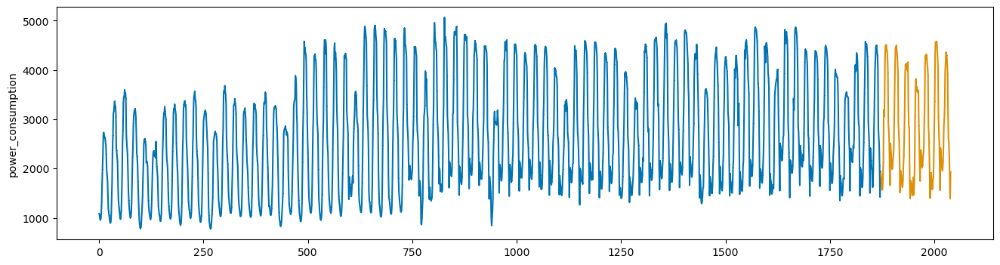

In [262]:
# 1번 건물로 확인
y = train_df.loc[train_df['building_num'] == 1, 'power_consumption']
x = train_df.loc[train_df['building_num'] == 1, :].drop(columns=['building_num', 'date', 'power_consumption'])

y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168) # 24시간*7일 = 168

print('train data shape\nx:{}, y:{}'.format(x_train.shape, y_train.shape))

plot_series(y_train, y_valid, markers=[',' , ','])
plt.show()

In [263]:
xgb_reg = XGBRegressor(n_estimators = 1000, seed=42,
                       min_child_weight = 1, eta = 0.3,
                       gamma = 0, max_depth = 6, 
                       colsample_bytree = 1, subsample = 1)

xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)], early_stopping_rounds=300, verbose=False)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False, eta=0.3,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=None,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=1, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             predictor=None, ...)

best iterations: 100
SMAPE : 7.080188806541197


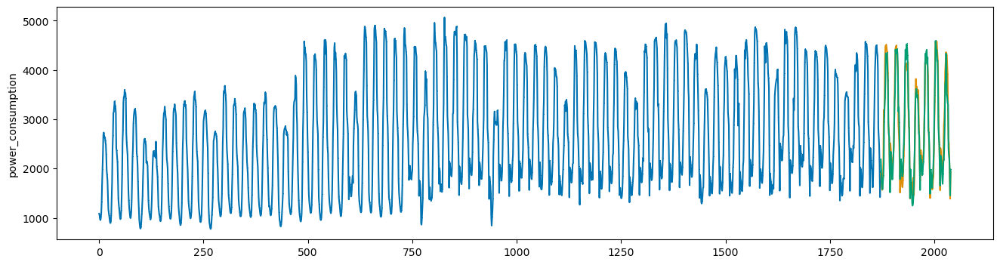

In [264]:
# yellow : true, green : pred
pred = xgb_reg.predict(x_valid)
pred = pd.Series(pred)
pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])

print('best iterations: {}'.format(xgb_reg.best_iteration))
print('SMAPE : {}'.format(SMAPE(y_valid, pred)))

In [265]:
xgb_reg2 = XGBRegressor(n_estimators = 1000, seed=42,
                       min_child_weight = 1, eta = 0.3,
                       gamma = 0, max_depth = 6, 
                       colsample_bytree = 1, subsample = 1)

xgb_reg2.set_params(**{'objective':weighted_mse(120)})

xgb_reg2.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)], early_stopping_rounds=300, verbose=False)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False, eta=0.3,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=None,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=1, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective=<function weighted_mse.<locals>.weighted_mse_fixed at 0x0000025C5CBF8EE0>, ...)

best iterations: 11
SMAPE : 5.649906553645208


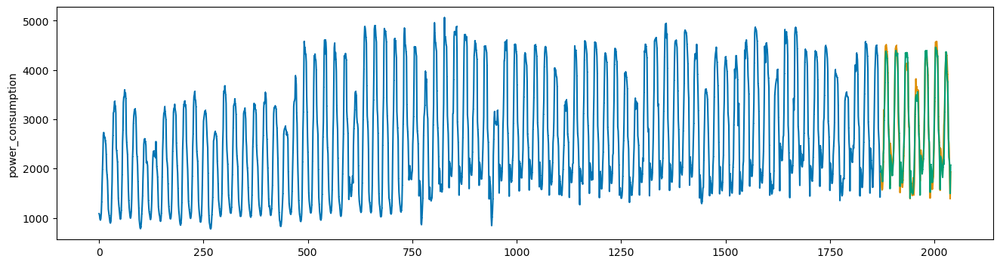

In [266]:
# yellow : true, green : pred
pred2 = xgb_reg2.predict(x_valid)
pred2 = pd.Series(pred2)
pred2.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
plot_series(y_train, y_valid, pd.Series(pred2), markers=[',' , ',', ','])

print('best iterations: {}'.format(xgb_reg2.best_iteration))
print('SMAPE : {}'.format(SMAPE(y_valid, pred2)))

(<Figure size 1600x400 with 1 Axes>, <AxesSubplot:ylabel='power_consumption'>)

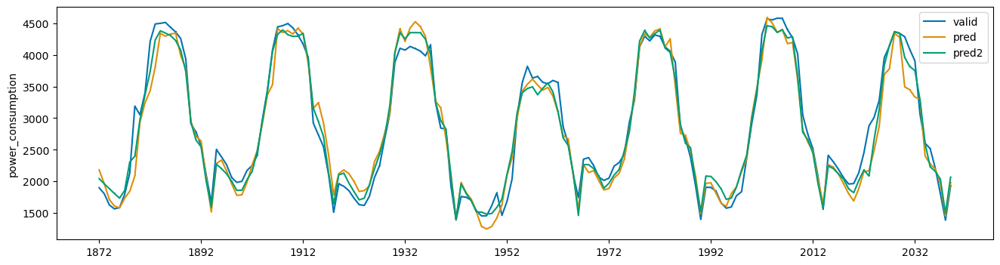

In [267]:
plot_series(y_valid, pd.Series(pred), pd.Series(pred2), markers=[',' , ',', ','], labels=['valid', 'pred', 'pred2'])

In [268]:
# find best iteration
scores = []   # smape 값을 저장할 list
best_iter = []  # best interation을 저장할 list

for i in tqdm(range(100)):
    y = train_df.loc[train_df.building_num == i+1, 'power_consumption']
    x = train_df.loc[train_df.building_num == i+1, ].drop(columns=['building_num', 'date', 'power_consumption'])
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168)
    
    model = XGBRegressor(n_estimators = 1000, eta = 0.01, min_child_weight = 1,
                           max_depth = 6, colsample_bytree = 1, 
                           subsample = 1, seed=42)
                           
    model.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정
    
    model.fit(x_train, y_train, eval_set=[(x_train, y_train), 
                                            (x_valid, y_valid)], early_stopping_rounds=300, verbose=False)
    # train set과 valid set으로 나누어서 train set부분으로 학습하고 valid set으로 검정

    y_pred = model.predict(x_valid)
    pred = pd.Series(y_pred)   
    sm = SMAPE(y_valid, y_pred)
    scores.append(sm)

    best_iter.append(model.best_iteration)

100%|██████████| 100/100 [04:47<00:00,  2.87s/it]


In [269]:
# find best alpha
best_scores = []   # smape 값을 저장할 list
best_alphas = []  # best interation을 저장할 list

for i in tqdm(range(100)):
    y = train_df.loc[train_df.building_num == i+1, 'power_consumption']
    x = train_df.loc[train_df.building_num == i+1, ].drop(columns=['building_num', 'date', 'power_consumption'])
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168)
    
    best_alpha = 10000
    best_score = 10000
    for alpha in range(0, 201, 10):
        model = XGBRegressor(n_estimators = best_iter[i], eta = 0.01, min_child_weight = 1,
                           max_depth = 6, colsample_bytree = 1, 
                           subsample = 1, seed=42)

        model.set_params(**{'objective':weighted_mse(alpha)})

        model.fit(x_train, y_train, verbose=False)

        y_pred = model.predict(x_valid)
        pred = pd.Series(y_pred)   
        sm = SMAPE(y_valid, y_pred)

        if sm < best_score:
            best_score = sm
            best_alpha = alpha
        else:
            best_score = best_score
            best_alpha = best_alpha
    
    print(f'building {i+1} : best_score={best_score}, best_alpha={best_alpha}')

    best_alphas.append(best_alpha)
    best_scores.append(best_score)

  1%|          | 1/100 [00:28<46:16, 28.05s/it]

building 1 : best_score=5.686871392250124, best_alpha=10


  2%|▏         | 2/100 [00:46<36:28, 22.34s/it]

building 2 : best_score=10.524233887737447, best_alpha=90


  3%|▎         | 3/100 [01:01<31:08, 19.26s/it]

building 3 : best_score=11.858114831303993, best_alpha=180


  4%|▍         | 4/100 [01:21<31:09, 19.47s/it]

building 4 : best_score=3.769457393905479, best_alpha=50


  5%|▌         | 5/100 [02:02<42:42, 26.97s/it]

building 5 : best_score=5.253979587942762, best_alpha=200


  6%|▌         | 6/100 [02:43<49:50, 31.81s/it]

building 6 : best_score=3.683433306746927, best_alpha=120


  7%|▋         | 7/100 [03:07<45:24, 29.30s/it]

building 7 : best_score=7.517308508305407, best_alpha=80


  8%|▊         | 8/100 [03:35<44:16, 28.87s/it]

building 8 : best_score=5.036001632341352, best_alpha=90


  9%|▉         | 9/100 [04:06<45:04, 29.71s/it]

building 9 : best_score=4.204474822253985, best_alpha=10


 10%|█         | 10/100 [04:26<39:40, 26.46s/it]

building 10 : best_score=7.212913996253903, best_alpha=20


 11%|█         | 11/100 [04:58<41:57, 28.29s/it]

building 11 : best_score=3.299408263041307, best_alpha=180


 12%|█▏        | 12/100 [06:01<56:50, 38.76s/it]

building 12 : best_score=3.856522296757399, best_alpha=110


 13%|█▎        | 13/100 [06:36<54:49, 37.81s/it]

building 13 : best_score=5.934839578039573, best_alpha=150


 14%|█▍        | 14/100 [06:52<44:42, 31.19s/it]

building 14 : best_score=16.537217709232046, best_alpha=100


 15%|█▌        | 15/100 [07:17<41:15, 29.13s/it]

building 15 : best_score=2.325537706295818, best_alpha=100


 16%|█▌        | 16/100 [07:36<36:47, 26.28s/it]

building 16 : best_score=4.601586395967755, best_alpha=140


 17%|█▋        | 17/100 [08:32<48:29, 35.05s/it]

building 17 : best_score=5.3314587320564915, best_alpha=120


 18%|█▊        | 18/100 [09:19<53:06, 38.86s/it]

building 18 : best_score=7.639385583094829, best_alpha=20


 19%|█▉        | 19/100 [10:15<59:17, 43.92s/it]

building 19 : best_score=8.934451709478402, best_alpha=20


 20%|██        | 20/100 [10:58<58:03, 43.54s/it]

building 20 : best_score=3.912427804775827, best_alpha=10


 21%|██        | 21/100 [12:02<1:05:24, 49.67s/it]

building 21 : best_score=6.153330624239967, best_alpha=200


 22%|██▏       | 22/100 [13:02<1:08:35, 52.76s/it]

building 22 : best_score=3.7158057787063097, best_alpha=10


 23%|██▎       | 23/100 [13:43<1:03:22, 49.39s/it]

building 23 : best_score=1.7990892983162285, best_alpha=170


 24%|██▍       | 24/100 [14:25<59:41, 47.12s/it]  

building 24 : best_score=2.3204720554159066, best_alpha=20


 25%|██▌       | 25/100 [15:09<57:44, 46.20s/it]

building 25 : best_score=2.131549204006369, best_alpha=80


 26%|██▌       | 26/100 [15:38<50:29, 40.94s/it]

building 26 : best_score=2.5559438594936004, best_alpha=10


 27%|██▋       | 27/100 [16:09<46:05, 37.88s/it]

building 27 : best_score=1.8603204041690597, best_alpha=10


 28%|██▊       | 28/100 [16:23<37:12, 31.00s/it]

building 28 : best_score=4.768847906756407, best_alpha=10


 29%|██▉       | 29/100 [16:49<34:40, 29.30s/it]

building 29 : best_score=3.8558037551982323, best_alpha=80


 30%|███       | 30/100 [17:14<32:34, 27.92s/it]

building 30 : best_score=6.554852753619859, best_alpha=10


 31%|███       | 31/100 [17:31<28:29, 24.77s/it]

building 31 : best_score=5.008592975625654, best_alpha=50


 32%|███▏      | 32/100 [18:13<34:00, 30.00s/it]

building 32 : best_score=0.3705948693187513, best_alpha=20


 33%|███▎      | 33/100 [19:10<42:37, 38.17s/it]

building 33 : best_score=0.4243242040468818, best_alpha=110


 34%|███▍      | 34/100 [20:01<46:13, 42.02s/it]

building 34 : best_score=0.7462826629842739, best_alpha=30


 35%|███▌      | 35/100 [20:48<46:55, 43.31s/it]

building 35 : best_score=0.37494652963910463, best_alpha=200


 36%|███▌      | 36/100 [21:51<52:43, 49.42s/it]

building 36 : best_score=0.5532609289128134, best_alpha=150


 37%|███▋      | 37/100 [22:39<51:25, 48.98s/it]

building 37 : best_score=4.058640415146794, best_alpha=140


 38%|███▊      | 38/100 [23:09<44:42, 43.27s/it]

building 38 : best_score=4.251911215441108, best_alpha=180


 39%|███▉      | 39/100 [23:42<40:47, 40.12s/it]

building 39 : best_score=4.214888164809396, best_alpha=70


 40%|████      | 40/100 [24:19<39:18, 39.30s/it]

building 40 : best_score=9.702135976695203, best_alpha=200


 41%|████      | 41/100 [25:12<42:36, 43.33s/it]

building 41 : best_score=4.450206436405323, best_alpha=10


 42%|████▏     | 42/100 [25:40<37:25, 38.71s/it]

building 42 : best_score=16.701267660558365, best_alpha=30


 43%|████▎     | 43/100 [26:39<42:28, 44.71s/it]

building 43 : best_score=6.047852326404201, best_alpha=40


 44%|████▍     | 44/100 [27:20<40:52, 43.80s/it]

building 44 : best_score=4.087827572428168, best_alpha=10


 45%|████▌     | 45/100 [28:20<44:24, 48.45s/it]

building 45 : best_score=2.3502456945080623, best_alpha=10


 46%|████▌     | 46/100 [28:44<37:10, 41.31s/it]

building 46 : best_score=4.7092184214287975, best_alpha=20


 47%|████▋     | 47/100 [29:08<31:45, 35.95s/it]

building 47 : best_score=4.2441619014406005, best_alpha=150


 48%|████▊     | 48/100 [29:43<31:02, 35.83s/it]

building 48 : best_score=2.21993705618992, best_alpha=20


 49%|████▉     | 49/100 [30:49<37:57, 44.66s/it]

building 49 : best_score=2.04872366250998, best_alpha=110


 50%|█████     | 50/100 [31:15<32:42, 39.25s/it]

building 50 : best_score=2.684854027154848, best_alpha=130


 51%|█████     | 51/100 [31:45<29:49, 36.52s/it]

building 51 : best_score=3.5578211747938795, best_alpha=60


 52%|█████▏    | 52/100 [32:36<32:37, 40.77s/it]

building 52 : best_score=3.1358985138192055, best_alpha=150


 53%|█████▎    | 53/100 [33:16<31:47, 40.58s/it]

building 53 : best_score=9.160620600718927, best_alpha=40


 54%|█████▍    | 54/100 [34:11<34:25, 44.90s/it]

building 54 : best_score=16.416907905063248, best_alpha=200


 55%|█████▌    | 55/100 [34:45<31:06, 41.48s/it]

building 55 : best_score=1.4937388540312422, best_alpha=150


 56%|█████▌    | 56/100 [35:40<33:32, 45.75s/it]

building 56 : best_score=0.6869719234867879, best_alpha=40


 57%|█████▋    | 57/100 [36:07<28:35, 39.90s/it]

building 57 : best_score=4.806502194977759, best_alpha=10


 58%|█████▊    | 58/100 [36:44<27:28, 39.25s/it]

building 58 : best_score=0.394889377277512, best_alpha=160


 59%|█████▉    | 59/100 [37:09<23:52, 34.95s/it]

building 59 : best_score=5.022885674524176, best_alpha=10


 60%|██████    | 60/100 [37:31<20:35, 30.89s/it]

building 60 : best_score=5.561678190339492, best_alpha=130


 61%|██████    | 61/100 [37:57<19:12, 29.55s/it]

building 61 : best_score=4.1961388371028105, best_alpha=60


 62%|██████▏   | 62/100 [38:23<17:59, 28.40s/it]

building 62 : best_score=4.399309810989934, best_alpha=170


 63%|██████▎   | 63/100 [38:47<16:43, 27.11s/it]

building 63 : best_score=4.538500130661337, best_alpha=180


 64%|██████▍   | 64/100 [39:20<17:15, 28.77s/it]

building 64 : best_score=3.5127809445935245, best_alpha=110


 65%|██████▌   | 65/100 [39:35<14:30, 24.86s/it]

building 65 : best_score=9.100126387241815, best_alpha=50


 66%|██████▌   | 66/100 [40:04<14:40, 25.91s/it]

building 66 : best_score=4.203372106470672, best_alpha=180


 67%|██████▋   | 67/100 [40:18<12:18, 22.38s/it]

building 67 : best_score=4.833787961674909, best_alpha=40


 68%|██████▊   | 68/100 [40:44<12:29, 23.43s/it]

building 68 : best_score=3.6753214294910572, best_alpha=130


 69%|██████▉   | 69/100 [41:12<12:50, 24.86s/it]

building 69 : best_score=2.459138961915722, best_alpha=10


 70%|███████   | 70/100 [41:53<14:47, 29.58s/it]

building 70 : best_score=4.707617667697284, best_alpha=160


 71%|███████   | 71/100 [42:28<15:05, 31.22s/it]

building 71 : best_score=3.273637575651938, best_alpha=100


 72%|███████▏  | 72/100 [43:16<17:01, 36.47s/it]

building 72 : best_score=4.102408154404017, best_alpha=150


 73%|███████▎  | 73/100 [43:43<15:08, 33.65s/it]

building 73 : best_score=3.287204738141152, best_alpha=70


 74%|███████▍  | 74/100 [44:17<14:34, 33.63s/it]

building 74 : best_score=4.634458043352889, best_alpha=20


 75%|███████▌  | 75/100 [44:39<12:36, 30.24s/it]

building 75 : best_score=3.586656846987203, best_alpha=50


 76%|███████▌  | 76/100 [45:04<11:23, 28.47s/it]

building 76 : best_score=5.031833347949798, best_alpha=120


 77%|███████▋  | 77/100 [45:34<11:04, 28.87s/it]

building 77 : best_score=2.3620307058898353, best_alpha=80


 78%|███████▊  | 78/100 [46:17<12:14, 33.37s/it]

building 78 : best_score=3.1168106006018133, best_alpha=50


 79%|███████▉  | 79/100 [47:02<12:51, 36.75s/it]

building 79 : best_score=2.337948889016803, best_alpha=190


 80%|████████  | 80/100 [47:43<12:41, 38.07s/it]

building 80 : best_score=2.9223390262153757, best_alpha=180


 81%|████████  | 81/100 [48:20<11:56, 37.70s/it]

building 81 : best_score=3.543216844437315, best_alpha=10


 82%|████████▏ | 82/100 [48:51<10:40, 35.56s/it]

building 82 : best_score=4.3486727220665236, best_alpha=20


 83%|████████▎ | 83/100 [49:19<09:26, 33.35s/it]

building 83 : best_score=2.53900702977153, best_alpha=180


 84%|████████▍ | 84/100 [49:48<08:32, 32.02s/it]

building 84 : best_score=2.218078500761785, best_alpha=190


 85%|████████▌ | 85/100 [50:35<09:10, 36.71s/it]

building 85 : best_score=3.1842493228043325, best_alpha=90


 86%|████████▌ | 86/100 [51:04<07:58, 34.21s/it]

building 86 : best_score=4.72489114738507, best_alpha=190


 87%|████████▋ | 87/100 [51:35<07:11, 33.23s/it]

building 87 : best_score=9.104404226279492, best_alpha=50


 88%|████████▊ | 88/100 [52:03<06:22, 31.88s/it]

building 88 : best_score=6.5737049597973805, best_alpha=160


 89%|████████▉ | 89/100 [52:39<06:04, 33.16s/it]

building 89 : best_score=8.55193603154548, best_alpha=130


 90%|█████████ | 90/100 [53:01<04:58, 29.80s/it]

building 90 : best_score=6.137249383365623, best_alpha=170


 91%|█████████ | 91/100 [53:28<04:19, 28.79s/it]

building 91 : best_score=12.378140766685737, best_alpha=10


 92%|█████████▏| 92/100 [53:54<03:43, 27.99s/it]

building 92 : best_score=5.135298073548343, best_alpha=80


 93%|█████████▎| 93/100 [54:24<03:20, 28.61s/it]

building 93 : best_score=6.297267693794901, best_alpha=10


 94%|█████████▍| 94/100 [55:02<03:08, 31.36s/it]

building 94 : best_score=6.237430965370826, best_alpha=40


 95%|█████████▌| 95/100 [55:29<02:31, 30.23s/it]

building 95 : best_score=13.712475849106273, best_alpha=80


 96%|█████████▌| 96/100 [56:00<02:01, 30.31s/it]

building 96 : best_score=3.0462453765649324, best_alpha=10


 97%|█████████▋| 97/100 [56:48<01:46, 35.51s/it]

building 97 : best_score=5.141594812949793, best_alpha=80


 98%|█████████▊| 98/100 [57:08<01:01, 30.91s/it]

building 98 : best_score=12.949218316807917, best_alpha=10


 99%|█████████▉| 99/100 [57:35<00:29, 29.76s/it]

building 99 : best_score=3.5353112776989817, best_alpha=130


100%|██████████| 100/100 [58:04<00:00, 34.85s/it]

building 100 : best_score=5.571499852414482, best_alpha=70


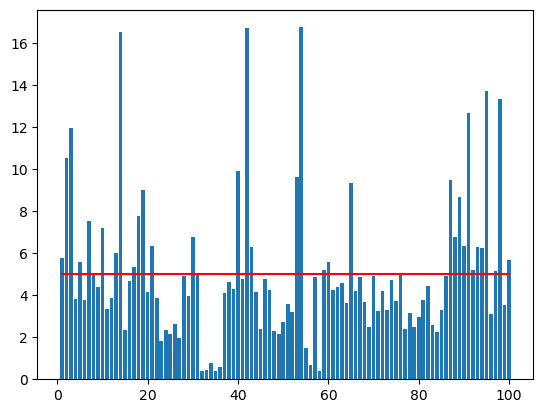

In [270]:
no_df = pd.DataFrame({'score':scores})
plt.bar(np.arange(len(no_df))+1, no_df['score'])
plt.plot([1,100], [5, 5], color = 'red')

## Prediction

In [271]:
# Process the missing values of precipitation
test_df['precipitation'].fillna(0, inplace=True) # 강수량은 0으로 채움

In [272]:
# Process the missing values of wind speed and humidity
def fill_missing_with_avg(df, columns):
    for i in range(len(df)):
        if pd.isna(df.loc[i, columns]):
            
            prev_value_sum = df.loc[i-4:i-1, columns].sum()
            next_value_sum = df.loc[i+1:i+4, columns].sum()
            avg_value = (prev_value_sum + next_value_sum) / 8

            df.loc[i, columns] = avg_value

fill_missing_with_avg(test_df, 'windspeed')
fill_missing_with_avg(test_df, 'humidity')

In [273]:
# Convert the type of date from object to datetime
test_df['date'] = pd.to_datetime(test_df['date'], format='%Y%m%d %H')

In [274]:
# Decomposition of time elements
test_df['month'] = test_df.date.dt.month
test_df['day'] = test_df.date.dt.day
test_df['weekday'] = test_df.date.dt.weekday
test_df['hour'] = test_df.date.dt.hour
test_df['date'] = test_df.date.dt.date

In [275]:
# Add time periodic columns
day_periodic = (test_df['day'] - 1) / 30 # 1부터 시작하므로 1을 빼줌
weekday_periodic = test_df['weekday'] / 6
hour_periodic = test_df['hour'] / 23

def sin_transform(values):
    return np.sin(2 * np.pi * values)
def cos_transform(values):
    return np.cos(2 * np.pi * values)

test_df['sin_weekday'] = sin_transform(weekday_periodic)
test_df['cos_weekday'] = cos_transform(weekday_periodic)
test_df['sin_hour'] = sin_transform(hour_periodic)
test_df['cos_hour'] = cos_transform(hour_periodic)

In [276]:
test_df['month_6'] = 0
test_df['month_7'] = 0

In [277]:
month_dummy = pd.get_dummies(test_df['month']).rename(columns={6:'month_6', 7:'month_7', 8:'month_8'})
test_df = pd.concat([test_df, month_dummy], axis=1)

In [278]:
# Add holiday column
# holiday = 1, workday = 0
test_df['holiday'] = test_df.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
test_df.loc[(test_df.date == datetime.date(2022, 6, 6))&(test_df.date == datetime.date(2022, 8, 15)), 'holiday'] = 1

In [279]:
# Add DI column (DI : Discomfort Index (불쾌지수))
test_df['DI'] = 9/5*test_df['temperature'] - 0.55*(1 - test_df['humidity']/100) * (9/5*test_df['humidity'] - 26) + 32

In [280]:
# Add CDH column (CDH : Cooling Degree-Day)
# CDD(냉방도일) -> CDH(냉방도시)로 데이터에 맞게 변형한 개념
# 냉방도일 : 어느 지방의 더운 정도를 나타내는 지표로 사용 (sum(해당 일의 기온 - 기준온도))
# 냉방도일이 크면 연료의 소비량이 많아짐
# 실내온도가 같아도 외부 기온은 지역별로 다름 -> 지역마다 값이 다르게 나타남 -> 이 데이터에서는 건물별로 다르다고 얘기할 수 있음
# 냉방도시 : sum(해당 시간의 기온 - 기준온도)
def CDH(df, num_building):
    df_ = df.copy()
    cdhs = np.array([])
    for num in range(1, num_building+1, 1):
        cdh = []
        cdh_df = df_[df_['building_num'] == num_building]
        cdh_temp = cdh_df['temperature'].values # Series로도 돌릴 수 있지만 array로 돌리는게 속도가 훨씬 빠름
        for i in range(len(cdh_temp)):
            if i < 11:
                cdh.append(np.sum(cdh_temp[:(i+1)] - 26))
            else:
                cdh.append(np.sum(cdh_temp[(i-11):(i+1)] - 26))
        
        cdhs = np.concatenate([cdhs, cdh])
    
    return cdhs

test_df['CDH'] = CDH(test_df, 100)

In [281]:
# 건물별, 요일별, 시간별 발전량 평균 넣어주기
tqdm.pandas()
test_df['day_hour_mean'] = test_df.progress_apply(lambda x : power_mean.loc[(power_mean.building_num == x['building_num']) & (power_mean.hour == x['hour']) & (power_mean.weekday == x['weekday']), 'power_consumption'].values[0], axis = 1)

100%|██████████| 16800/16800 [00:07<00:00, 2277.45it/s]


In [282]:
# 건물별, 요일별, 시간별 발전량 표준편차 넣어주기
tqdm.pandas()
test_df['day_hour_std'] = test_df.progress_apply(lambda x : power_std.loc[(power_std.building_num == x['building_num']) & (power_std.hour == x['hour']) & (power_std.weekday == x['weekday']), 'power_consumption'].values[0], axis = 1)

100%|██████████| 16800/16800 [00:07<00:00, 2373.73it/s]


In [283]:
# 건물별 시간별 발전량 평균 넣어주기
tqdm.pandas()
test_df['hour_mean'] = test_df.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.building_num == x['building_num']) & (power_hour_mean.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)

100%|██████████| 16800/16800 [00:04<00:00, 3775.26it/s]


In [284]:
# 건물별 시간별 발전량 표준편차 넣어주기
tqdm.pandas()
test_df['hour_std'] = test_df.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.building_num == x['building_num']) & (power_hour_std.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)

100%|██████████| 16800/16800 [00:04<00:00, 3754.31it/s]


In [285]:
# 건물별 요일별 발전량 평균 넣어주기
tqdm.pandas()
test_df['weekday_mean'] = test_df.progress_apply(lambda x : power_weekday_mean.loc[(power_weekday_mean.building_num == x['building_num']) & (power_weekday_mean.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)

100%|██████████| 16800/16800 [00:04<00:00, 3888.00it/s]


In [286]:
# 건물별 요일별 발전량 표준편차 넣어주기
tqdm.pandas()
test_df['weekday_std'] = test_df.progress_apply(lambda x : power_weekday_std.loc[(power_weekday_std.building_num == x['building_num']) & (power_weekday_std.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)

100%|██████████| 16800/16800 [00:04<00:00, 3931.20it/s]


In [287]:
test_df.drop(columns=['month', 'day', 'weekday', 'hour'], inplace=True)

In [288]:
# 전체 데이터로 학습(best iteration과 best alpha에 맞게) 후 test dataset에 대해 예측 수행
models = []
preds = []
feature_importances = []
for i in tqdm(range(100)):
    y = train_df.loc[train_df.building_num == i+1, 'power_consumption']
    x = train_df.loc[train_df.building_num == i+1, ].drop(columns=['building_num', 'date', 'power_consumption'])
    
    model = XGBRegressor(n_estimators = best_iter[i], eta = 0.01, min_child_weight = 1,
                           max_depth = 6, colsample_bytree = 1, 
                           subsample = 1, seed=42)

    if best_alphas[i] != 0:
        model.set_params(**{'objective':weighted_mse(best_alphas[i])})
    
    model.fit(x, y, verbose=False)

    pred = model.predict(test_df[test_df['building_num'] == i+1].drop(columns=['building_num','date']))
    preds.append(pred)
    
    feature_importance = model.feature_importances_
    feature_importances.append(feature_importance)

    models.append(model)

100%|██████████| 100/100 [03:00<00:00,  1.81s/it]


In [358]:
building_num_df = pd.DataFrame({'building_num':range(1,101)})
feature_imp_df = pd.DataFrame(columns=test_df.columns[2:], data=[value for value in feature_importances])
feature_imp_df = pd.concat([building_num_df, feature_imp_df], axis=1)
feature_imp_df.to_csv('xgb6_feature_imp.csv', index=False)

In [359]:
xgb_best_params = pd.DataFrame({'best_iter':best_iter, 'best_alpha':best_alphas})
xgb_best_params.to_csv('xgb6_best_params.csv', index=False)

In [369]:
max_values = []
max_indices = []
for index, row in feature_imp_df.drop(columns=['building_num']).iterrows():
    max_value = row.max()
    max_index = row.idxmax()
    max_values.append(max_value)
    max_indices.append(max_index)

In [290]:
final = pd.DataFrame({'answer':[]})
for pred in preds:

    pred_df = pd.DataFrame({'answer':pred})
    final = pd.concat([final, pred_df], axis=0)

In [293]:
sample_submission['answer'] = final.values
sample_submission.to_csv('xgb6.csv', index=False)

In [291]:
final

,answer
0,2081.461914
1,1963.768555
2,1811.256958
3,1685.502930
4,1648.615601
...,...
163,877.186829
164,839.489075
165,777.992432
166,635.667908


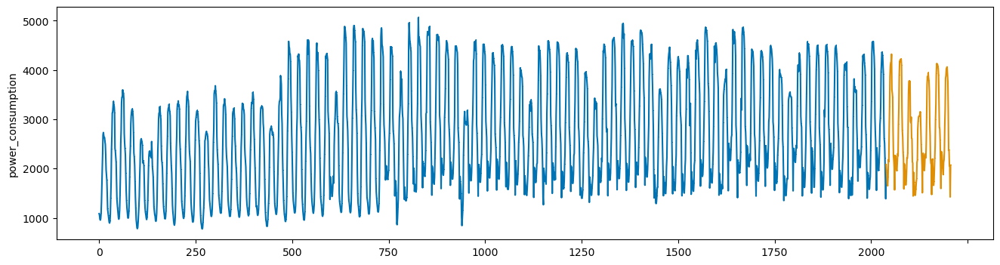

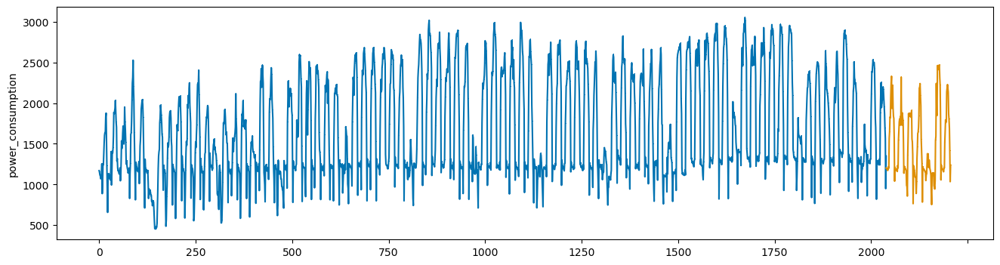

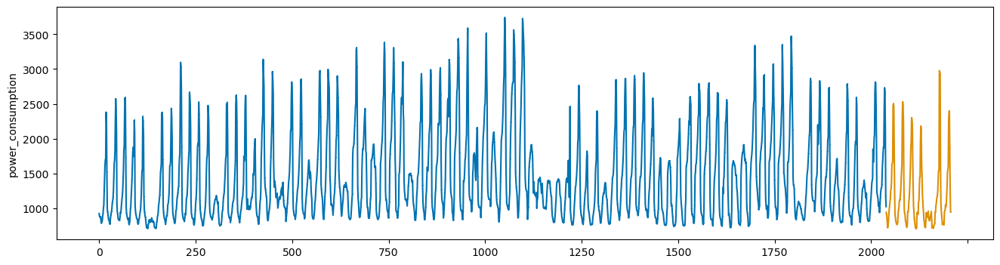

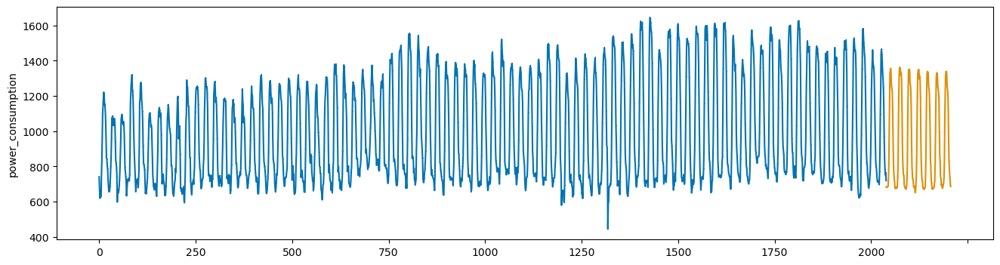

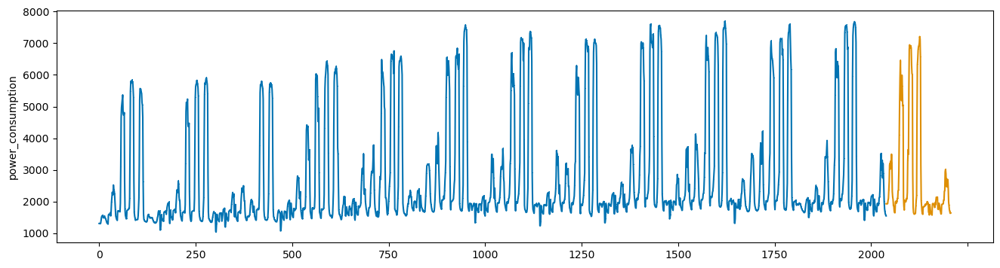

...

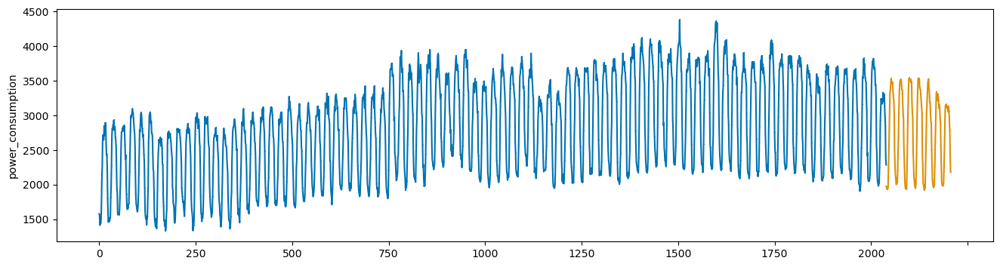

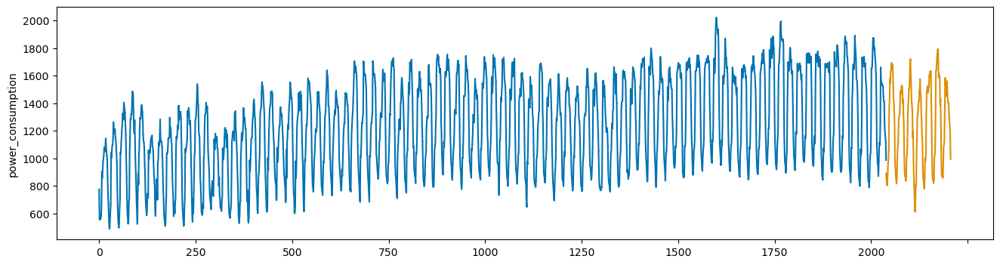

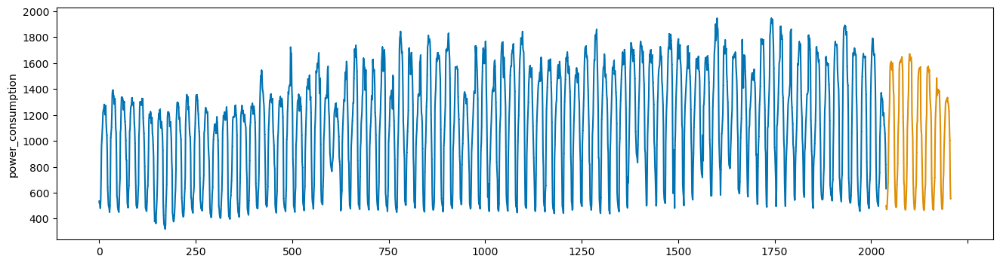

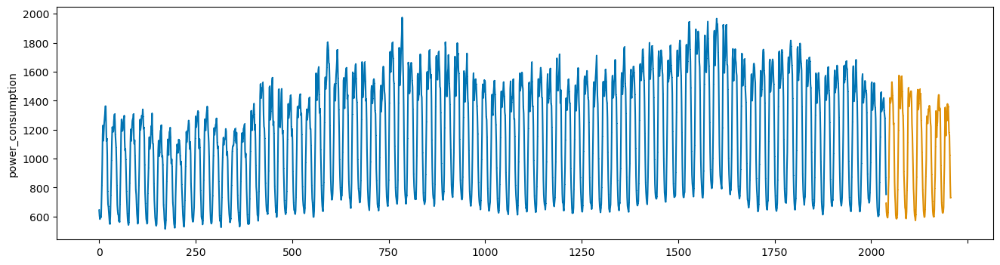

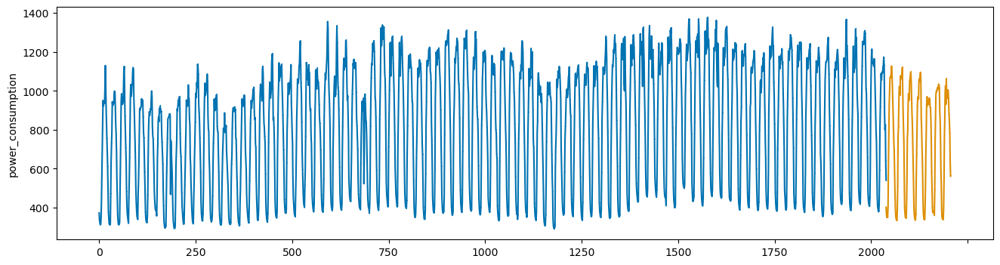

In [292]:
for i in range(100):
    power_train = train_df.loc[train_df.building_num == i+1, 'power_consumption'].reset_index(drop=True)
    power_pred = final[i*168:(i+1)*168]
    power_pred.index = range(power_train.index[-1], power_train.index[-1]+168)
    
    plot_series(power_train, power_pred, markers=[',', ','])